In [1]:
%matplotlib inline 
import json
import numpy as np
import operator
import os
import pandas
import pylab as plt
import random
from ase.data import reference_states, atomic_numbers
from sklearn.neighbors.kde import KernelDensity
from pyiron.project import Project

/scratch/janssen/pyiron_meltingpoint_mg/.snakemake/conda/f10559cf/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import matplotlib as mpl
mpl.rc('font', family='Times New Roman')
plt.rcParams["mathtext.fontset"] = "stix"

In [3]:
from pyiron.thermodynamics.interfacemethod import freeze_one_half, remove_selective_dynamics, set_server, create_job_template, fix_iso, fix_z_dir, half_velocity, minimize_pos, minimize_vol, next_calc, npt_solid, npt_liquid, next_step_funct, round_temperature_next, strain_circle, analyse_minimized_structure, get_press, get_center_point, get_strain_lst, get_nve_job_name, plot_solid_liquid_ratio, ratio_selection, plot_equilibration, plot_melting_point_prediction, calc_temp_iteration, get_initial_melting_temperature_guess, validate_convergence, initialise_iterators, get_voronoi_volume, check_for_holes

In [4]:
pr = Project('melting')

In [5]:
input_file = os.path.join(pr.path, 'input.json')
output_file = os.path.join(pr.path, 'output.json')

In [6]:
# Parameters
input_file = "input.json"
output_file = "output.json"


In [7]:
pr.job_table()

""


In [8]:
if os.path.exists(input_file) and os.stat(input_file).st_size != 0:
    with open(input_file, 'r') as f:
        input_dict = json.load(f)
else:
    input_dict = {
        "config": [
            "pair_style morse 9.97749\n",
            "pair_coeff * * 0.4174 1.3885 2.845\n"
        ],
        "species": ["Al"],
        "element": "Al"
    }


In [9]:
input_dict

{'config': ['pair_style eam/fs \n', 'pair_coeff * * Mg.eam.fs Mg\n'],
 'filename': './examples/hcpMg/Mg.eam.fs',
 'species': ['Mg'],
 'element': 'Mg',
 'cpu_cores': 8}

In [10]:
pot_dict = input_dict.copy()

In [11]:
if 'model' not in pot_dict.keys():
    pot_dict['model'] = 'Lammps'
if 'name' not in pot_dict.keys():
    pot_dict['name'] = 'CustomPotential'
if 'filename' not in pot_dict.keys():
    pot_path = []
else:
    pot_path = [os.path.abspath(pot_dict['filename'])]
potential = pandas.DataFrame({'Config': [pot_dict['config']],
                             'Filename': [pot_path],
                             'Model': [pot_dict['model']],
                             'Name': [pot_dict['name']],
                             'Species': [pot_dict['species']]
                             })

In [12]:
project_parameter = {
    'project': pr,
    'run_time_steps': 50000,
    'nvt_run_time_steps': 10000,
    'nve_run_time_steps': 10000,
    'temperature_left': 0,
    'temperature_right': 1000,
    'strain_run_time_steps': 1000,
    'convergence_criterion': 1,
    'potential': potential,
    'cpu_cores': 1, 
    'job_type': pr.job_type.Lammps,
    'enable_h5md': False,
    'points': 21,
    'boundary_value': 0.25,
    'ratio_boundary': 0.25,
    'timestep_lst': [2, 2, 1],
    'fit_range_lst': [0.05, 0.01, 0.01],
    'nve_run_time_steps_lst': [25000, 20000, 50000],
    'number_of_atoms': 8000, 
}

In [13]:
for k in input_dict.keys():
    project_parameter[k] = input_dict[k]

In [14]:
if 'crystalstructure' not in project_parameter.keys():
    project_parameter['crystalstructure'] = reference_states[atomic_numbers[project_parameter['element']]]['symmetry']

In [15]:
if 'seed' not in project_parameter.keys():
    project_parameter['seed'] = random.randint(0,99999)
project_parameter['seed']

67936

In [16]:
# Values from a previous calculation can be inserted here to reproduce the results 
step_dict = {}
if os.path.exists(output_file):
    with open(output_file, 'r') as f:
        step_dict_str = json.load(f)
    for k,v in step_dict_str.items():
        step_dict[int(k)] = v
step_dict

{}

# From here on the notebook is automated - no change required !

In [17]:
step_count = 0
temperature_next = None
enable_iteration = True
convergence_goal_achieved = False

In [18]:
pr = project_parameter['project']

In [19]:
if 'lattice_constant' in project_parameter.keys():
    basis = pr.create_structure(project_parameter['element'], project_parameter['crystalstructure'].lower(), project_parameter['lattice_constant'])
elif project_parameter['crystalstructure'] == 'hcp':
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=False)
else:
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=True)
basis_lst = [basis.repeat([i, i, i]) for i in range(5,30)]
basis = basis_lst[np.argmin([np.abs(len(b)-project_parameter['number_of_atoms']/2) for b in basis_lst])]

In [20]:
basis.analyse_ovito_cna_adaptive()

{'CommonNeighborAnalysis.counts.BCC': 0, 'CommonNeighborAnalysis.counts.FCC': 0, 'CommonNeighborAnalysis.counts.HCP': 4394, 'CommonNeighborAnalysis.counts.ICO': 0, 'CommonNeighborAnalysis.counts.OTHER': 0}

In [21]:
basis.plot3d()

_ColormakerRegistry()

NGLWidget()

In [22]:
# pr.remove_jobs(recursive=True)

In [23]:
timestep_iter, fit_range_iter, nve_run_time_steps_iter = initialise_iterators(project_parameter)
timestep = next(timestep_iter)
fit_range = next(fit_range_iter)
nve_run_time_steps = next(nve_run_time_steps_iter)

In [24]:
pr.job_table()

""


# Step 1: set up the solid sample and roughly estimate a melting point

In [25]:
ham_minimize_pos= minimize_pos(
    structure=basis, 
    project_parameter=project_parameter
)

The job minimize_pos was saved and received the ID: 1


In [26]:
ham_minimize_vol = minimize_vol(
    structure=ham_minimize_pos.get_structure(), 
    project_parameter=project_parameter
)

The job minimize_vol was saved and received the ID: 2


In [27]:
temperature_next, structure_left = get_initial_melting_temperature_guess(
    project_parameter=project_parameter, 
    ham_minimize_vol=ham_minimize_vol, 
    temperature_next=temperature_next
)

The job temp_heating_1000 was saved and received the ID: 3


The job temp_heating_500_0 was saved and received the ID: 4


The job temp_heating_750_0 was saved and received the ID: 5


The job temp_heating_875_0 was saved and received the ID: 6


The job temp_heating_937_5 was saved and received the ID: 7


The job temp_heating_906_25 was saved and received the ID: 8


The job temp_heating_890_625 was saved and received the ID: 9


The job temp_heating_882_8125 was saved and received the ID: 10


In [28]:
temperature_next   # +/- 100K 

883

In [29]:
if step_count in step_dict.keys():
    temperature_next = step_dict[step_count]['temperature_next']
else: 
    step_dict[step_count]= {'temperature_next': temperature_next}

In [30]:
step_dict

{0: {'temperature_next': 883}}

# Step 2: set up the interface structure

The job ham_npt_solid_883 was saved and received the ID: 11


The job ham_npt_liquid_high_1883 was saved and received the ID: 12


The job ham_npt_liquid_low_883 was saved and received the ID: 13


2020-05-04 07:53:49,088 - pyiron_log - WARNING - Job 'ham_nve_0_95_883_0' does not exist and cannot be loaded


The job ham_nvt_0_95_883_0 was saved and received the ID: 14


2020-05-04 07:55:34,362 - pyiron_log - WARNING - Job 'ham_nve_0_955_883_0' does not exist and cannot be loaded


The job ham_nvt_0_955_883_0 was saved and received the ID: 15


2020-05-04 07:57:17,891 - pyiron_log - WARNING - Job 'ham_nve_0_96_883_0' does not exist and cannot be loaded


The job ham_nvt_0_96_883_0 was saved and received the ID: 16


2020-05-04 07:59:00,487 - pyiron_log - WARNING - Job 'ham_nve_0_965_883_0' does not exist and cannot be loaded


The job ham_nvt_0_965_883_0 was saved and received the ID: 17


2020-05-04 08:00:43,932 - pyiron_log - WARNING - Job 'ham_nve_0_97_883_0' does not exist and cannot be loaded


The job ham_nvt_0_97_883_0 was saved and received the ID: 18


2020-05-04 08:02:25,290 - pyiron_log - WARNING - Job 'ham_nve_0_975_883_0' does not exist and cannot be loaded


The job ham_nvt_0_975_883_0 was saved and received the ID: 19


2020-05-04 08:04:07,257 - pyiron_log - WARNING - Job 'ham_nve_0_98_883_0' does not exist and cannot be loaded


The job ham_nvt_0_98_883_0 was saved and received the ID: 20


2020-05-04 08:05:48,233 - pyiron_log - WARNING - Job 'ham_nve_0_985_883_0' does not exist and cannot be loaded


The job ham_nvt_0_985_883_0 was saved and received the ID: 21


2020-05-04 08:07:29,339 - pyiron_log - WARNING - Job 'ham_nve_0_99_883_0' does not exist and cannot be loaded


The job ham_nvt_0_99_883_0 was saved and received the ID: 22


2020-05-04 08:09:08,671 - pyiron_log - WARNING - Job 'ham_nve_0_995_883_0' does not exist and cannot be loaded


The job ham_nvt_0_995_883_0 was saved and received the ID: 23


2020-05-04 08:10:48,898 - pyiron_log - WARNING - Job 'ham_nve_1_0_883_0' does not exist and cannot be loaded


The job ham_nvt_1_0_883_0 was saved and received the ID: 24


2020-05-04 08:12:28,255 - pyiron_log - WARNING - Job 'ham_nve_1_005_883_0' does not exist and cannot be loaded


The job ham_nvt_1_005_883_0 was saved and received the ID: 25


2020-05-04 08:14:08,570 - pyiron_log - WARNING - Job 'ham_nve_1_01_883_0' does not exist and cannot be loaded


The job ham_nvt_1_01_883_0 was saved and received the ID: 26


2020-05-04 08:15:47,493 - pyiron_log - WARNING - Job 'ham_nve_1_015_883_0' does not exist and cannot be loaded


The job ham_nvt_1_015_883_0 was saved and received the ID: 27


2020-05-04 08:17:25,377 - pyiron_log - WARNING - Job 'ham_nve_1_02_883_0' does not exist and cannot be loaded


The job ham_nvt_1_02_883_0 was saved and received the ID: 28


2020-05-04 08:19:03,771 - pyiron_log - WARNING - Job 'ham_nve_1_025_883_0' does not exist and cannot be loaded


The job ham_nvt_1_025_883_0 was saved and received the ID: 29


2020-05-04 08:20:41,012 - pyiron_log - WARNING - Job 'ham_nve_1_03_883_0' does not exist and cannot be loaded


The job ham_nvt_1_03_883_0 was saved and received the ID: 30


2020-05-04 08:22:17,129 - pyiron_log - WARNING - Job 'ham_nve_1_035_883_0' does not exist and cannot be loaded


The job ham_nvt_1_035_883_0 was saved and received the ID: 31


2020-05-04 08:23:53,920 - pyiron_log - WARNING - Job 'ham_nve_1_04_883_0' does not exist and cannot be loaded


The job ham_nvt_1_04_883_0 was saved and received the ID: 32


2020-05-04 08:25:30,802 - pyiron_log - WARNING - Job 'ham_nve_1_045_883_0' does not exist and cannot be loaded


The job ham_nvt_1_045_883_0 was saved and received the ID: 33


2020-05-04 08:27:07,544 - pyiron_log - WARNING - Job 'ham_nve_1_05_883_0' does not exist and cannot be loaded


The job ham_nvt_1_05_883_0 was saved and received the ID: 34


The job ham_nve_0_95_883_0 was saved and received the ID: 35


The job ham_nve_0_955_883_0 was saved and received the ID: 36


The job ham_nve_0_96_883_0 was saved and received the ID: 37


The job ham_nve_0_965_883_0 was saved and received the ID: 38


The job ham_nve_0_97_883_0 was saved and received the ID: 39


The job ham_nve_0_975_883_0 was saved and received the ID: 40


The job ham_nve_0_98_883_0 was saved and received the ID: 41


The job ham_nve_0_985_883_0 was saved and received the ID: 42


The job ham_nve_0_99_883_0 was saved and received the ID: 43


The job ham_nve_0_995_883_0 was saved and received the ID: 44


The job ham_nve_1_0_883_0 was saved and received the ID: 45


The job ham_nve_1_005_883_0 was saved and received the ID: 46


The job ham_nve_1_01_883_0 was saved and received the ID: 47


The job ham_nve_1_015_883_0 was saved and received the ID: 48


The job ham_nve_1_02_883_0 was saved and received the ID: 49


The job ham_nve_1_025_883_0 was saved and received the ID: 50


The job ham_nve_1_03_883_0 was saved and received the ID: 51


The job ham_nve_1_035_883_0 was saved and received the ID: 52


The job ham_nve_1_04_883_0 was saved and received the ID: 53


The job ham_nve_1_045_883_0 was saved and received the ID: 54


The job ham_nve_1_05_883_0 was saved and received the ID: 55


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


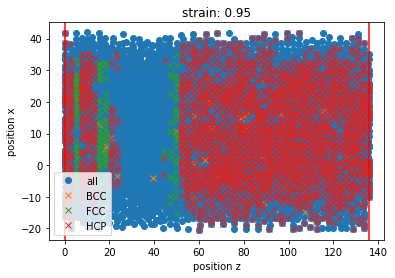

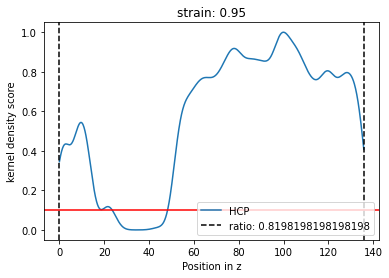

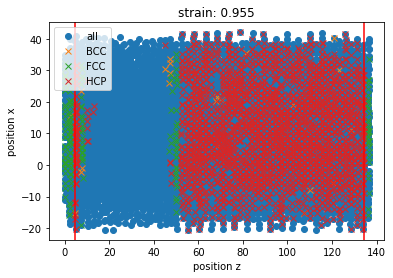

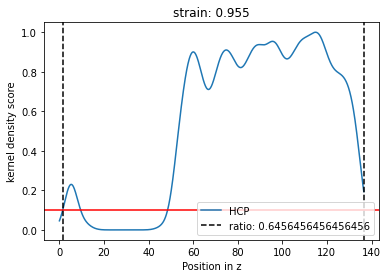

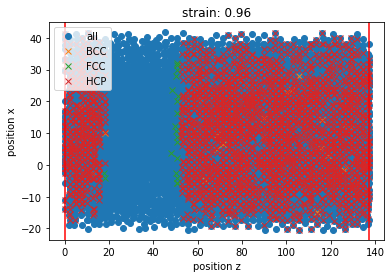

...

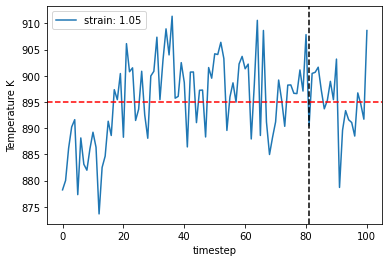

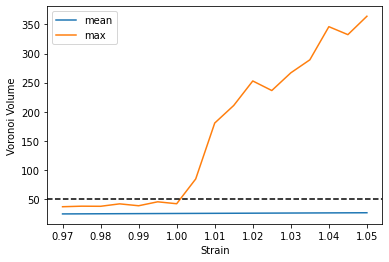

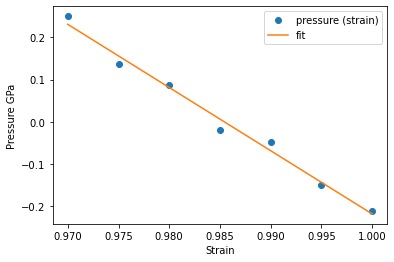

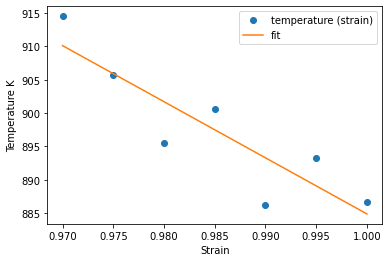

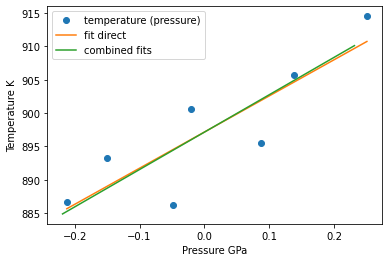

897.1581729342792 897.1464202038335


In [31]:
temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep = timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=None,
        debug_plot=True)

In [32]:
temperature_next, temperature_mean, temperature_left, temperature_right

(897.1581729342792, 900.3734986286986, 893.3052838564416, 907.4417134009556)

# Step 3: run NVT and NVE MD

In [33]:
output = validate_convergence(
    pr=pr,
    temperature_left=temperature_left,
    temperature_next=temperature_next,
    temperature_right=temperature_right,
    enable_iteration=enable_iteration,
    timestep_iter=timestep_iter,
    timestep_lst=project_parameter['timestep_lst'],
    timestep=timestep,
    fit_range_iter=fit_range_iter,
    fit_range_lst=project_parameter['fit_range_lst'],
    fit_range=fit_range,
    nve_run_time_steps_iter=nve_run_time_steps_iter,
    nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'],
    nve_run_time_steps=nve_run_time_steps,
    strain_result_lst=strain_result_lst,
    pressure_result_lst=pressure_result_lst,
    step_count=step_count,
    step_dict=step_dict,
    boundary_value=project_parameter['boundary_value'],
    ratio_boundary=project_parameter['ratio_boundary'],
    convergence_goal=project_parameter['convergence_criterion'],
    output_file=output_file
)
convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output

In [34]:
step_dict[step_count]

{'timestep': 2,
 'fit_range': 0.01,
 'nve_run_time_steps': 20000,
 'boundary_value': 0.25,
 'ratio_boundary': 0.25,
 'temperature_next': 897.1581729342792,
 'center': 0.99}

In [35]:
convergence_goal_achieved

False

# Step 4: full cycle, predict the final melting point

The job ham_npt_solid_897_16 was saved and received the ID: 56


The job ham_npt_liquid_high_1897_1599999999999 was saved and received the ID: 57


The job ham_npt_liquid_low_897_16 was saved and received the ID: 58


2020-05-04 10:21:36,431 - pyiron_log - WARNING - Job 'ham_nve_0_98_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_98_897_16_1 was saved and received the ID: 59


2020-05-04 10:23:17,262 - pyiron_log - WARNING - Job 'ham_nve_0_981_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_981_897_16_1 was saved and received the ID: 60


2020-05-04 10:24:59,974 - pyiron_log - WARNING - Job 'ham_nve_0_982_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_982_897_16_1 was saved and received the ID: 61


2020-05-04 10:26:41,187 - pyiron_log - WARNING - Job 'ham_nve_0_983_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_983_897_16_1 was saved and received the ID: 62


2020-05-04 10:28:22,600 - pyiron_log - WARNING - Job 'ham_nve_0_984_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_984_897_16_1 was saved and received the ID: 63


2020-05-04 10:30:04,122 - pyiron_log - WARNING - Job 'ham_nve_0_985_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_985_897_16_1 was saved and received the ID: 64


2020-05-04 10:31:44,469 - pyiron_log - WARNING - Job 'ham_nve_0_986_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_986_897_16_1 was saved and received the ID: 65


2020-05-04 10:33:26,990 - pyiron_log - WARNING - Job 'ham_nve_0_987_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_987_897_16_1 was saved and received the ID: 66


2020-05-04 10:35:07,113 - pyiron_log - WARNING - Job 'ham_nve_0_988_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_988_897_16_1 was saved and received the ID: 67


2020-05-04 10:36:48,542 - pyiron_log - WARNING - Job 'ham_nve_0_989_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_989_897_16_1 was saved and received the ID: 68


2020-05-04 10:38:27,713 - pyiron_log - WARNING - Job 'ham_nve_0_99_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_99_897_16_1 was saved and received the ID: 69


2020-05-04 10:40:08,825 - pyiron_log - WARNING - Job 'ham_nve_0_991_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_991_897_16_1 was saved and received the ID: 70


2020-05-04 10:41:49,937 - pyiron_log - WARNING - Job 'ham_nve_0_992_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_992_897_16_1 was saved and received the ID: 71


2020-05-04 10:43:30,399 - pyiron_log - WARNING - Job 'ham_nve_0_993_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_993_897_16_1 was saved and received the ID: 72


2020-05-04 10:45:10,421 - pyiron_log - WARNING - Job 'ham_nve_0_994_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_994_897_16_1 was saved and received the ID: 73


2020-05-04 10:46:50,668 - pyiron_log - WARNING - Job 'ham_nve_0_995_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_995_897_16_1 was saved and received the ID: 74


2020-05-04 10:48:30,640 - pyiron_log - WARNING - Job 'ham_nve_0_996_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_996_897_16_1 was saved and received the ID: 75


2020-05-04 10:50:09,815 - pyiron_log - WARNING - Job 'ham_nve_0_997_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_997_897_16_1 was saved and received the ID: 76


2020-05-04 10:51:49,255 - pyiron_log - WARNING - Job 'ham_nve_0_998_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_998_897_16_1 was saved and received the ID: 77


2020-05-04 10:53:29,443 - pyiron_log - WARNING - Job 'ham_nve_0_999_897_16_1' does not exist and cannot be loaded


The job ham_nvt_0_999_897_16_1 was saved and received the ID: 78


2020-05-04 10:55:08,480 - pyiron_log - WARNING - Job 'ham_nve_1_0_897_16_1' does not exist and cannot be loaded


The job ham_nvt_1_0_897_16_1 was saved and received the ID: 79


The job ham_nve_0_98_897_16_1 was saved and received the ID: 80


The job ham_nve_0_981_897_16_1 was saved and received the ID: 81


The job ham_nve_0_982_897_16_1 was saved and received the ID: 82


The job ham_nve_0_983_897_16_1 was saved and received the ID: 83


The job ham_nve_0_984_897_16_1 was saved and received the ID: 84


The job ham_nve_0_985_897_16_1 was saved and received the ID: 85


The job ham_nve_0_986_897_16_1 was saved and received the ID: 86


The job ham_nve_0_987_897_16_1 was saved and received the ID: 87


The job ham_nve_0_988_897_16_1 was saved and received the ID: 88


The job ham_nve_0_989_897_16_1 was saved and received the ID: 89


The job ham_nve_0_99_897_16_1 was saved and received the ID: 90


The job ham_nve_0_991_897_16_1 was saved and received the ID: 91


The job ham_nve_0_992_897_16_1 was saved and received the ID: 92


The job ham_nve_0_993_897_16_1 was saved and received the ID: 93


The job ham_nve_0_994_897_16_1 was saved and received the ID: 94


The job ham_nve_0_995_897_16_1 was saved and received the ID: 95


The job ham_nve_0_996_897_16_1 was saved and received the ID: 96


The job ham_nve_0_997_897_16_1 was saved and received the ID: 97


The job ham_nve_0_998_897_16_1 was saved and received the ID: 98


The job ham_nve_0_999_897_16_1 was saved and received the ID: 99


The job ham_nve_1_0_897_16_1 was saved and received the ID: 100


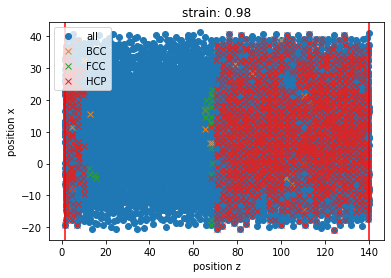

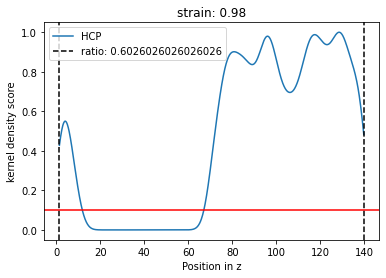

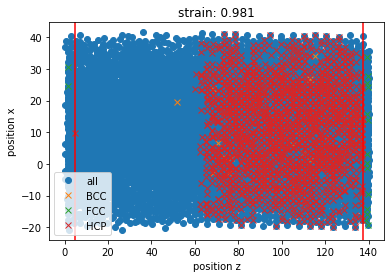

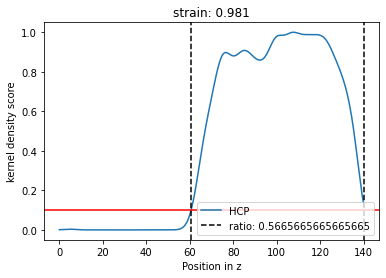

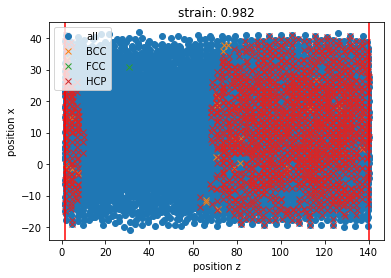

...

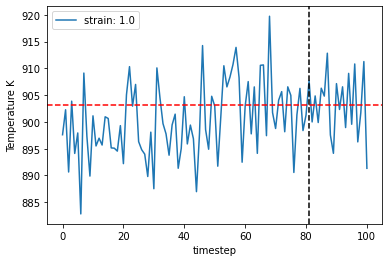

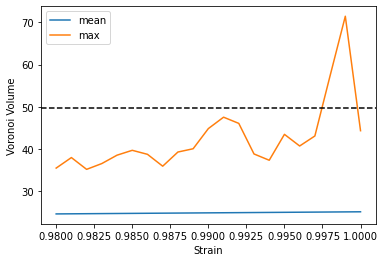

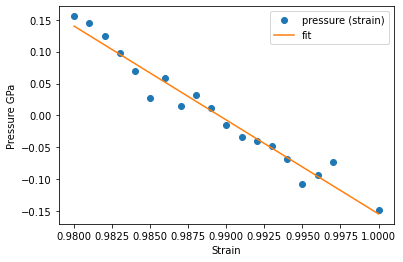

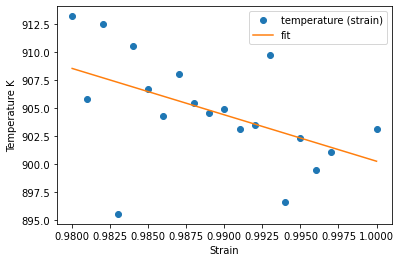

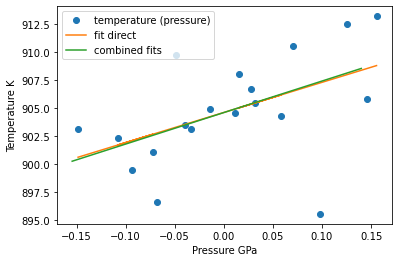

904.5899566303735 904.5827207684586
904.5899566303735 904.3580340803153 899.9517577276065 908.764310433024
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 904.5899566303735, 'center': 0.99}


The job ham_npt_solid_904_59 was saved and received the ID: 101


The job ham_npt_liquid_high_1904_5900000000001 was saved and received the ID: 102


The job ham_npt_liquid_low_904_59 was saved and received the ID: 103


2020-05-04 12:32:01,440 - pyiron_log - WARNING - Job 'ham_nve_0_98_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_98_904_59_2 was saved and received the ID: 104


2020-05-04 12:33:41,187 - pyiron_log - WARNING - Job 'ham_nve_0_981_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_981_904_59_2 was saved and received the ID: 105


2020-05-04 12:35:19,569 - pyiron_log - WARNING - Job 'ham_nve_0_982_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_982_904_59_2 was saved and received the ID: 106


2020-05-04 12:36:59,026 - pyiron_log - WARNING - Job 'ham_nve_0_983_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_983_904_59_2 was saved and received the ID: 107


2020-05-04 12:38:38,890 - pyiron_log - WARNING - Job 'ham_nve_0_984_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_984_904_59_2 was saved and received the ID: 108


2020-05-04 12:40:16,732 - pyiron_log - WARNING - Job 'ham_nve_0_985_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_985_904_59_2 was saved and received the ID: 109


2020-05-04 12:41:55,514 - pyiron_log - WARNING - Job 'ham_nve_0_986_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_986_904_59_2 was saved and received the ID: 110


2020-05-04 12:43:33,805 - pyiron_log - WARNING - Job 'ham_nve_0_987_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_987_904_59_2 was saved and received the ID: 111


2020-05-04 12:45:13,247 - pyiron_log - WARNING - Job 'ham_nve_0_988_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_988_904_59_2 was saved and received the ID: 112


2020-05-04 12:46:52,554 - pyiron_log - WARNING - Job 'ham_nve_0_989_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_989_904_59_2 was saved and received the ID: 113


2020-05-04 12:48:30,260 - pyiron_log - WARNING - Job 'ham_nve_0_99_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_99_904_59_2 was saved and received the ID: 114


2020-05-04 12:50:09,791 - pyiron_log - WARNING - Job 'ham_nve_0_991_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_991_904_59_2 was saved and received the ID: 115


2020-05-04 12:51:47,949 - pyiron_log - WARNING - Job 'ham_nve_0_992_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_992_904_59_2 was saved and received the ID: 116


2020-05-04 12:53:25,782 - pyiron_log - WARNING - Job 'ham_nve_0_993_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_993_904_59_2 was saved and received the ID: 117


2020-05-04 12:55:03,723 - pyiron_log - WARNING - Job 'ham_nve_0_994_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_994_904_59_2 was saved and received the ID: 118


2020-05-04 12:56:40,907 - pyiron_log - WARNING - Job 'ham_nve_0_995_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_995_904_59_2 was saved and received the ID: 119


2020-05-04 12:58:18,659 - pyiron_log - WARNING - Job 'ham_nve_0_996_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_996_904_59_2 was saved and received the ID: 120


2020-05-04 12:59:56,243 - pyiron_log - WARNING - Job 'ham_nve_0_997_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_997_904_59_2 was saved and received the ID: 121


2020-05-04 13:01:32,769 - pyiron_log - WARNING - Job 'ham_nve_0_998_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_998_904_59_2 was saved and received the ID: 122


2020-05-04 13:03:10,385 - pyiron_log - WARNING - Job 'ham_nve_0_999_904_59_2' does not exist and cannot be loaded


The job ham_nvt_0_999_904_59_2 was saved and received the ID: 123


2020-05-04 13:04:47,228 - pyiron_log - WARNING - Job 'ham_nve_1_0_904_59_2' does not exist and cannot be loaded


The job ham_nvt_1_0_904_59_2 was saved and received the ID: 124


The job ham_nve_0_98_904_59_2 was saved and received the ID: 125


The job ham_nve_0_981_904_59_2 was saved and received the ID: 126


The job ham_nve_0_982_904_59_2 was saved and received the ID: 127


The job ham_nve_0_983_904_59_2 was saved and received the ID: 128


The job ham_nve_0_984_904_59_2 was saved and received the ID: 129


The job ham_nve_0_985_904_59_2 was saved and received the ID: 130


The job ham_nve_0_986_904_59_2 was saved and received the ID: 131


The job ham_nve_0_987_904_59_2 was saved and received the ID: 132


The job ham_nve_0_988_904_59_2 was saved and received the ID: 133


The job ham_nve_0_989_904_59_2 was saved and received the ID: 134


The job ham_nve_0_99_904_59_2 was saved and received the ID: 135


The job ham_nve_0_991_904_59_2 was saved and received the ID: 136


The job ham_nve_0_992_904_59_2 was saved and received the ID: 137


The job ham_nve_0_993_904_59_2 was saved and received the ID: 138


The job ham_nve_0_994_904_59_2 was saved and received the ID: 139


The job ham_nve_0_995_904_59_2 was saved and received the ID: 140


The job ham_nve_0_996_904_59_2 was saved and received the ID: 141


The job ham_nve_0_997_904_59_2 was saved and received the ID: 142


The job ham_nve_0_998_904_59_2 was saved and received the ID: 143


The job ham_nve_0_999_904_59_2 was saved and received the ID: 144


The job ham_nve_1_0_904_59_2 was saved and received the ID: 145


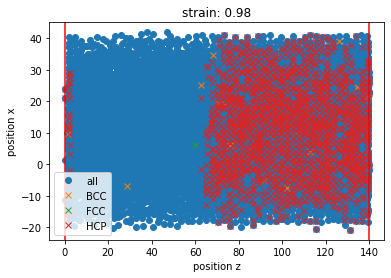

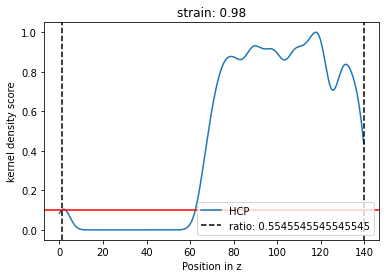

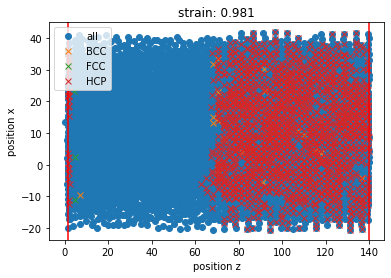

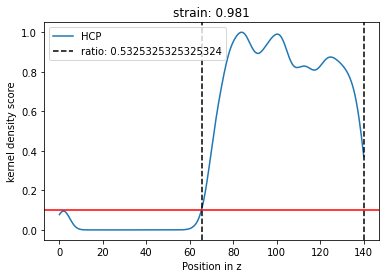

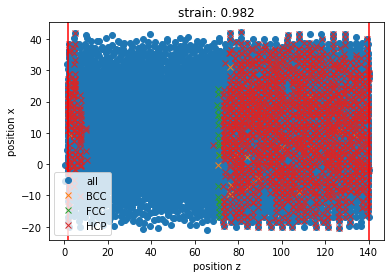

...

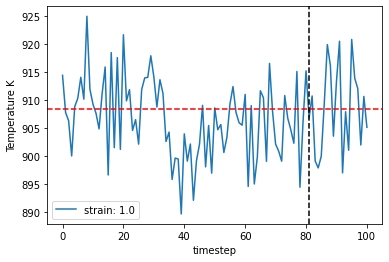

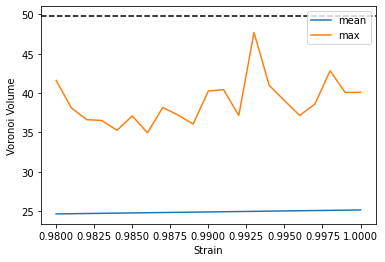

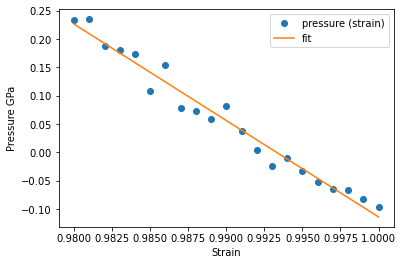

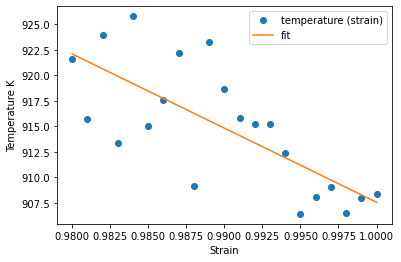

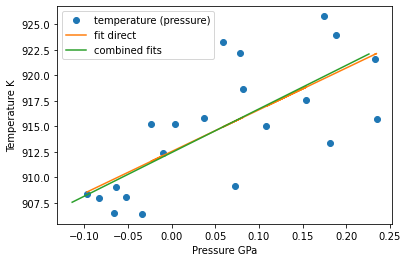

912.526678206942 912.4249199351782
912.526678206942 916.0947784404156 911.246707258887 920.9428496219441
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 912.526678206942, 'center': 0.99}


The job ham_npt_solid_912_53 was saved and received the ID: 146


The job ham_npt_liquid_high_1912_53 was saved and received the ID: 147


The job ham_npt_liquid_low_912_53 was saved and received the ID: 148


2020-05-04 16:20:01,522 - pyiron_log - WARNING - Job 'ham_nve_0_98_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_98_912_53_2 was saved and received the ID: 149


2020-05-04 16:21:42,246 - pyiron_log - WARNING - Job 'ham_nve_0_981_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_981_912_53_2 was saved and received the ID: 150


2020-05-04 16:23:20,964 - pyiron_log - WARNING - Job 'ham_nve_0_982_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_982_912_53_2 was saved and received the ID: 151


2020-05-04 16:25:01,280 - pyiron_log - WARNING - Job 'ham_nve_0_983_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_983_912_53_2 was saved and received the ID: 152


2020-05-04 16:26:39,963 - pyiron_log - WARNING - Job 'ham_nve_0_984_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_984_912_53_2 was saved and received the ID: 153


2020-05-04 16:28:19,780 - pyiron_log - WARNING - Job 'ham_nve_0_985_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_985_912_53_2 was saved and received the ID: 154


2020-05-04 16:29:57,681 - pyiron_log - WARNING - Job 'ham_nve_0_986_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_986_912_53_2 was saved and received the ID: 155


2020-05-04 16:31:36,098 - pyiron_log - WARNING - Job 'ham_nve_0_987_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_987_912_53_2 was saved and received the ID: 156


2020-05-04 16:33:14,923 - pyiron_log - WARNING - Job 'ham_nve_0_988_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_988_912_53_2 was saved and received the ID: 157


2020-05-04 16:34:54,155 - pyiron_log - WARNING - Job 'ham_nve_0_989_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_989_912_53_2 was saved and received the ID: 158


2020-05-04 16:36:32,946 - pyiron_log - WARNING - Job 'ham_nve_0_99_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_99_912_53_2 was saved and received the ID: 159


2020-05-04 16:38:11,362 - pyiron_log - WARNING - Job 'ham_nve_0_991_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_991_912_53_2 was saved and received the ID: 160


2020-05-04 16:39:49,745 - pyiron_log - WARNING - Job 'ham_nve_0_992_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_992_912_53_2 was saved and received the ID: 161


2020-05-04 16:41:28,753 - pyiron_log - WARNING - Job 'ham_nve_0_993_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_993_912_53_2 was saved and received the ID: 162


2020-05-04 16:43:06,753 - pyiron_log - WARNING - Job 'ham_nve_0_994_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_994_912_53_2 was saved and received the ID: 163


2020-05-04 16:44:44,486 - pyiron_log - WARNING - Job 'ham_nve_0_995_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_995_912_53_2 was saved and received the ID: 164


2020-05-04 16:46:22,301 - pyiron_log - WARNING - Job 'ham_nve_0_996_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_996_912_53_2 was saved and received the ID: 165


2020-05-04 16:48:01,450 - pyiron_log - WARNING - Job 'ham_nve_0_997_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_997_912_53_2 was saved and received the ID: 166


2020-05-04 16:49:39,016 - pyiron_log - WARNING - Job 'ham_nve_0_998_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_998_912_53_2 was saved and received the ID: 167


2020-05-04 16:51:16,933 - pyiron_log - WARNING - Job 'ham_nve_0_999_912_53_2' does not exist and cannot be loaded


The job ham_nvt_0_999_912_53_2 was saved and received the ID: 168


2020-05-04 16:52:54,558 - pyiron_log - WARNING - Job 'ham_nve_1_0_912_53_2' does not exist and cannot be loaded


The job ham_nvt_1_0_912_53_2 was saved and received the ID: 169


The job ham_nve_0_98_912_53_2 was saved and received the ID: 170


The job ham_nve_0_981_912_53_2 was saved and received the ID: 171


The job ham_nve_0_982_912_53_2 was saved and received the ID: 172


The job ham_nve_0_983_912_53_2 was saved and received the ID: 173


The job ham_nve_0_984_912_53_2 was saved and received the ID: 174


The job ham_nve_0_985_912_53_2 was saved and received the ID: 175


The job ham_nve_0_986_912_53_2 was saved and received the ID: 176


The job ham_nve_0_987_912_53_2 was saved and received the ID: 177


The job ham_nve_0_988_912_53_2 was saved and received the ID: 178


The job ham_nve_0_989_912_53_2 was saved and received the ID: 179


The job ham_nve_0_99_912_53_2 was saved and received the ID: 180


The job ham_nve_0_991_912_53_2 was saved and received the ID: 181


The job ham_nve_0_992_912_53_2 was saved and received the ID: 182


The job ham_nve_0_993_912_53_2 was saved and received the ID: 183


The job ham_nve_0_994_912_53_2 was saved and received the ID: 184


The job ham_nve_0_995_912_53_2 was saved and received the ID: 185


The job ham_nve_0_996_912_53_2 was saved and received the ID: 186


The job ham_nve_0_997_912_53_2 was saved and received the ID: 187


The job ham_nve_0_998_912_53_2 was saved and received the ID: 188


The job ham_nve_0_999_912_53_2 was saved and received the ID: 189


The job ham_nve_1_0_912_53_2 was saved and received the ID: 190


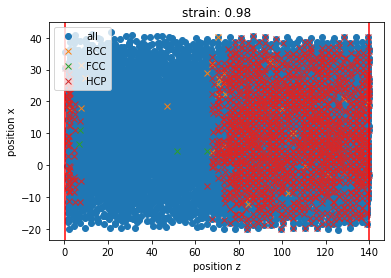

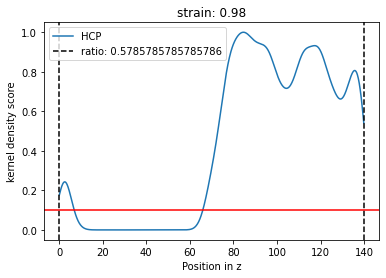

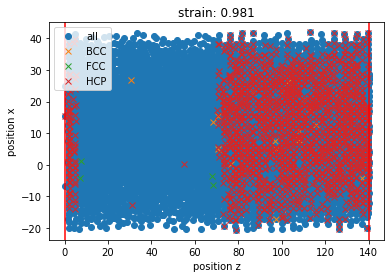

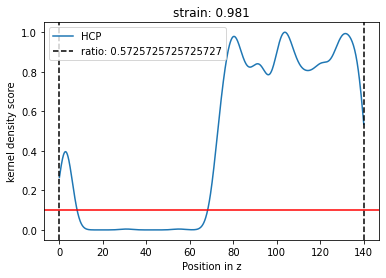

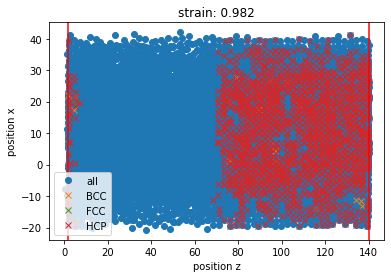

...

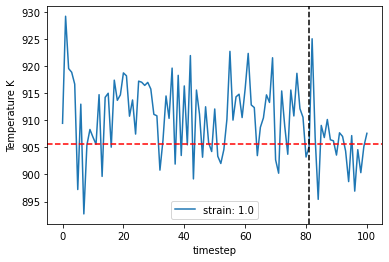

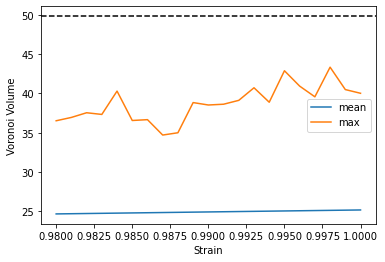

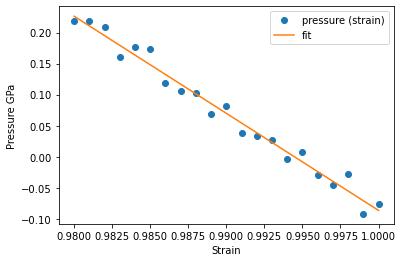

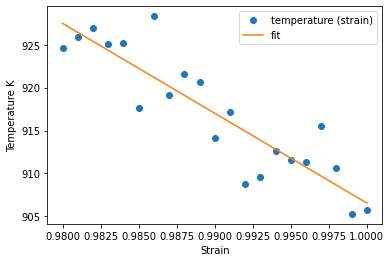

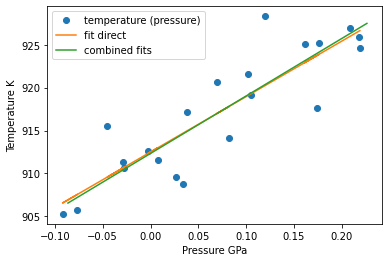

912.4945481891099 912.3285150032666
912.4945481891099 916.7992333937057 911.0351772651254 922.563289522286
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 912.4945481891099, 'center': 0.99}


In [36]:
temperature_estimate_lst, temperature_calculated_lst = [], []
while len(temperature_calculated_lst) < 3 or not convergence_goal_achieved and len(temperature_calculated_lst) < 10:
    temperature_estimate_lst.append(temperature_next)
    temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep=timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=center,
        debug_plot=True)
    print(temperature_next, temperature_mean, temperature_left, temperature_right)
    output = validate_convergence(pr=pr,
                                  temperature_left=temperature_left, 
                                  temperature_next=temperature_next, 
                                  temperature_right=temperature_right, 
                                  enable_iteration=enable_iteration,
                                  timestep_iter=timestep_iter,
                                  timestep_lst=project_parameter['timestep_lst'],
                                  timestep=timestep,
                                  fit_range_iter=fit_range_iter, 
                                  fit_range_lst=project_parameter['fit_range_lst'], 
                                  fit_range=fit_range, 
                                  nve_run_time_steps_iter=nve_run_time_steps_iter, 
                                  nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'], 
                                  nve_run_time_steps=nve_run_time_steps,
                                  strain_result_lst=strain_result_lst, 
                                  pressure_result_lst=pressure_result_lst, 
                                  step_count=step_count, 
                                  step_dict=step_dict, 
                                  boundary_value=project_parameter['boundary_value'], 
                                  ratio_boundary=project_parameter['ratio_boundary'],
                                  convergence_goal=project_parameter['convergence_criterion'],
                                  output_file=output_file)
    convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output
    print(step_dict[step_count])
    temperature_calculated_lst.append(temperature_next)

In [37]:
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        json.dump(step_dict, f)

In [38]:
step_dict

{0: {'temperature_next': 883},
 1: {'timestep': 2,
  'fit_range': 0.01,
  'nve_run_time_steps': 20000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 897.1581729342792,
  'center': 0.99},
 2: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 904.5899566303735,
  'center': 0.99},
 3: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 912.526678206942,
  'center': 0.99},
 4: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 912.4945481891099,
  'center': 0.99}}

findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


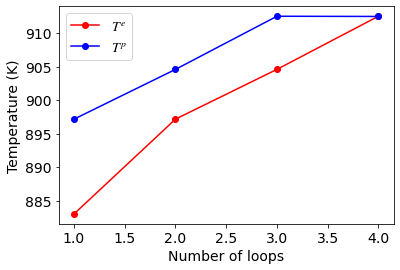

In [39]:
#plot the convergence of loop calculations
first_key = list(step_dict.keys())[-1]
second_key = 'temperature_next'
allt = [step_dict[key][second_key] for key in list(step_dict.keys())]
plt.plot(np.arange(1, len(allt)), allt[0:-1], 'ro-', label=r"$T^e$")
plt.plot(np.arange(1, len(allt)), allt[1:], 'bo-', label=r"$T^p$")
plt.legend(fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.xlabel('Number of loops', fontsize=14)
plt.ylabel('Temperature (K)', fontsize=14)
plt.show()

In [40]:
df = pr.job_table()
df

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Mg4394,minimize_pos,/minimize_pos,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 07:28:20.336965,2020-05-04 07:28:21.086749,0.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,NaN,None
1,2,finished,Mg4394,minimize_vol,/minimize_vol,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 07:28:22.335086,2020-05-04 07:28:23.206142,0.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,NaN,None
2,3,finished,Mg4394,temp_heating_1000,/temp_heating_1000,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 07:28:25.199057,2020-05-04 07:28:30.547293,5.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,NaN,None
3,4,finished,Mg4394,temp_heating_500_0,/temp_heating_500_0,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 07:28:31.717926,2020-05-04 07:28:36.849707,5.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,NaN,None
4,5,finished,Mg4394,temp_heating_750_0,/temp_heating_750_0,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 07:28:38.020331,2020-05-04 07:28:43.336552,5.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,186,finished,Mg8788,ham_nve_0_996_912_53_2,/ham_nve_0_996_912_53_2,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 19:03:17.263637,2020-05-04 19:11:12.793453,475.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,165.0,None
186,187,finished,Mg8788,ham_nve_0_997_912_53_2,/ham_nve_0_997_912_53_2,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 19:11:15.101680,2020-05-04 19:19:09.819593,474.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,166.0,None
187,188,finished,Mg8788,ham_nve_0_998_912_53_2,/ham_nve_0_998_912_53_2,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 19:19:12.025120,2020-05-04 19:27:10.885146,478.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,167.0,None
188,189,finished,Mg8788,ham_nve_0_999_912_53_2,/ham_nve_0_999_912_53_2,/scratch/janssen/pyiron_meltingpoint_mg/,melting/,2020-05-04 19:27:13.143503,2020-05-04 19:35:06.187499,473.0,pyiron@cmpc16.mpie.de#8,Lammps,0.1,168.0,None
